"Video Enhancement with Image Filters: Blurring, Edge Detection, and Sharpening"

This notebook demonstrates video enhancement using various filters, including blurring filters (both box and Gaussian), edge detection (Canny), and sharpening (unsharp mask). Utilizing an image processing library, the program loads a video, processes each frame with different filters, and combines the original and enhanced frames into a single output video. Experimentation with filter types and parameters allows observation of their effects on the video. The enhanced video is then saved, showcasing the impact of diverse image filters on visual quality and content perception.

In [ ]:
import cv2

In [ ]:
!mkdir frames

In [ ]:
!mkdir frames_box

In [ ]:
!mkdir frames_unsharp

In [ ]:
!mkdir frames_canny

In [ ]:

video1 = cv2.VideoCapture("/content/habibi.mp4")
success,image = video1.read()
count = 0
# print(image, success)
while success:
  name = f'frames_box/frame{count}.jpg'
  # Saves the frames with frame-count
  blur = cv2.boxFilter(image,-1,(5,5))
  # edges = cv2.Canny(image=blur, threshold1=100, threshold2=200)
  cv2.imwrite(name, blur)
  success,image = video1.read()
  count += 1

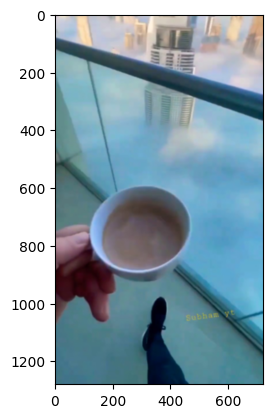

In [ ]:
import matplotlib.pyplot as plt
img = cv2.imread("/content/frames_box/frame50.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

In [ ]:
video = cv2.VideoCapture("/content/habibi.mp4")
success,image = video.read()
count = 0
while success:
  name = f'frames_canny/frame{count}.jpg'
  # Saves the frames with frame-count
  # blur = cv2.boxFilter(image,-1,(5,5))
  edges = cv2.Canny(image=image, threshold1=100, threshold2=200)
  cv2.imwrite(name, edges)
  success,image = video.read()
  count += 1

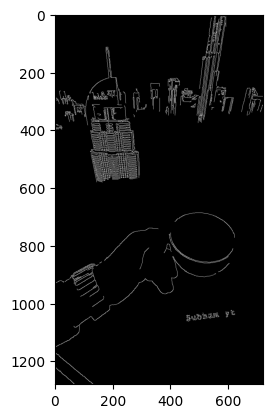

In [ ]:
img = cv2.imread("/content/frames_canny/frame100.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

In [ ]:
def unsharp(image, sigma, strength):

    # Median filtering
    image_mf = median_filter(image, sigma)

    # Calculate the Laplacian
    lap = cv2.Laplacian(image_mf,cv2.CV_64F)

    # Calculate the sharpened image
    sharp = image-strength*lap

    # Saturate the pixels in either direction
    sharp[sharp>255] = 255
    sharp[sharp<0] = 0

    return sharp

In [ ]:
import numpy as np
from scipy.ndimage.filters import median_filter

<ipython-input-17-22a3a9d75fea>:2: DeprecationWarning: Please use `median_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import median_filter


In [ ]:
import numpy as np

In [ ]:
video = cv2.VideoCapture("/content/habibi.mp4")
success,image = video.read()
count = 0
while success:
  name = f'frames_unsharp/frame{count}.jpg'
  # Saves the frames with frame-count
  sharp1 = np.zeros_like(image)
  for i in range(3):
    sharp1[:,:,i] = unsharp(image[:,:,i], 5, 0.8)
  cv2.imwrite(name, sharp1)
  success,image = video.read()
  count += 1

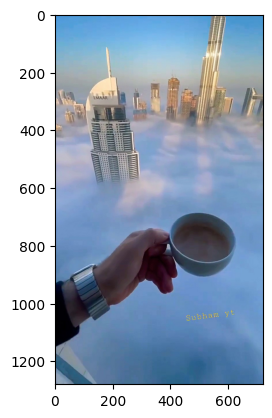

In [ ]:
img = cv2.imread("/content/frames_unsharp/frame100.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

In [ ]:
def frames_to_vid(image_folder,video_name):
  images = [img for img in os.listdir(image_folder) if img.endswith(".jpg")]
  images.sort()

  frame = cv2.imread(os.path.join(image_folder, images[0]))
  height, width, layers = frame.shape

  video = cv2.VideoWriter(video_name, cv2.VideoWriter_fourcc(*'mp4v'), 1, (width,height))

  for image in images:
      video.write(cv2.imread(os.path.join(image_folder, image)))

  cv2.destroyAllWindows()
  video.release()

In [ ]:
image_folder = 'frames_box'
video_name = 'frames/output_video_box.mp4'

frames_to_vid(image_folder,video_name)

In [ ]:
!cp frames_box/*.jpg -r frames_canny/

In [ ]:
image_folder = 'frames_canny'
video_name = 'frames/output_video_canny.mp4'

frames_to_vid(image_folder,video_name)

In [ ]:
!cp frames_box/*.jpg -r frames_unsharp/

In [ ]:
image_folder = 'frames_unsharp'
video_name = 'frames/output_video_unsharp.mp4'

frames_to_vid(image_folder,video_name)

In [ ]:
import os
for i in os.listdir("frames_unsharp"):
  if i == "frames/output_video_unsharp.mp4":
    print("ok")
  # print(i)

In [ ]:
from IPython.display import HTML
from base64 import b64encode

def show_video(video_path, video_width = 600):

  video_file = open(video_path, "r+b").read()

  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")

show_video("/content/frames/output_video_canny.mp4")